# Set-up

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft2, ifft2
from scipy.integrate import odeint
import time

# Define parameters
tspan = np.arange(0, 4.5, 0.5)
nu = 0.001
Lx, Ly = 20, 20
nx, ny = 64, 64
N = nx * ny

# Define spatial domain and initial conditions
x2 = np.linspace(-Lx/2, Lx/2, nx + 1)
x = x2[:nx]
y2 = np.linspace(-Ly/2, Ly/2, ny + 1)
y = y2[:ny]
X, Y = np.meshgrid(x, y)
w = 1 * np.exp(-X**2 - Y**2/20) #+ 1j * np.zeros((nx, ny)) # Initialize as complex
w2 = w.reshape(N)

# Define spectral k values
kx = (2 * np.pi / Lx) * np.concatenate((np.arange(0, nx/2), np.arange(-nx/2, 0)))
kx[0] = 1e-6
ky = (2 * np.pi / Ly) * np.concatenate((np.arange(0, ny/2), np.arange(-ny/2, 0)))
ky[0] = 1e-6
KX, KY = np.meshgrid(kx, ky)
K = KX**2 + KY**2



# HW4 Matrices

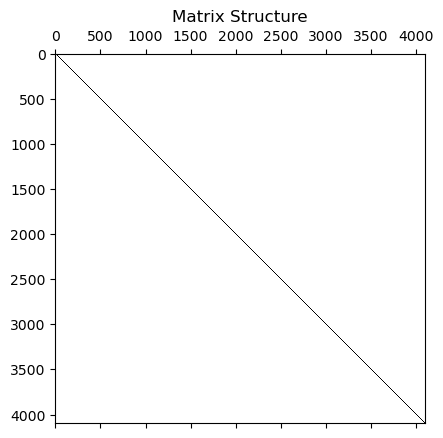

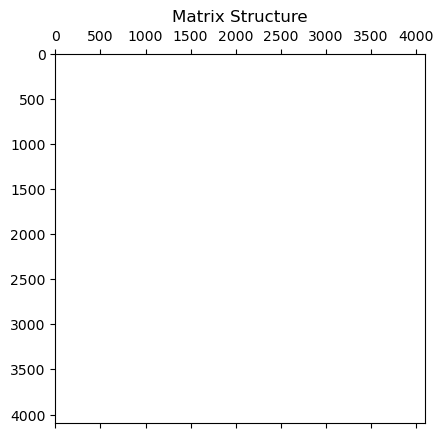

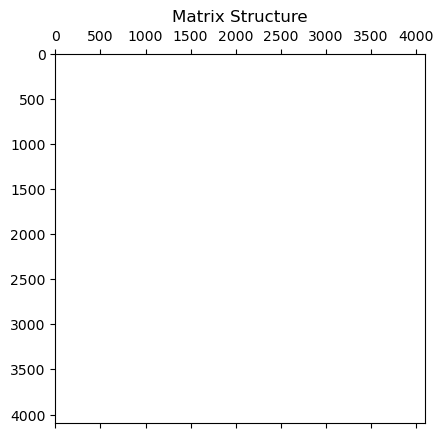

In [2]:
from scipy.sparse import spdiags

m = 64  # N value in x and y directions
n = m * m  # total size of matrix
L = 20
dx = L/m

e0 = np.zeros((n, 1))  # vector of zeros
e1 = np.ones((n, 1))   # vector of ones
e2 = np.copy(e1)    # copy the one vector
e4 = np.copy(e0)    # copy the zero vector

for j in range(1, m+1):
    e2[m*j-1] = 0  # overwrite every m^th value with zero
    e4[m*j-1] = 1  # overwirte every m^th value with one

# Shift to correct positions
e3 = np.zeros_like(e2)
e3[1:n] = e2[0:n-1]
e3[0] = e2[n-1]

e5 = np.zeros_like(e4)
e5[1:n] = e4[0:n-1]
e5[0] = e4[n-1]

# Place diagonal elements
diagonals = [e1.flatten(), e1.flatten(), e5.flatten(), 
             e2.flatten(), -4 * e1.flatten(), e3.flatten(), 
             e4.flatten(), e1.flatten(), e1.flatten()]
offsets = [-(n-m), -m, -m+1, -1, 0, 1, m-1, m, (n-m)]

matA = spdiags(diagonals, offsets, n, n).toarray()
matA[0,0] = 2
A = matA / (dx**2)

# Plot matrix structure
#plt.figure(5)
plt.spy(A)
plt.title('Matrix Structure')
plt.show()


####B matrix

offdiag_right = np.ones((n, 1))  # vector of ones
offdiag_left = -1*np.ones((n, 1))   # vector of ones
top_right = -1*np.ones((n, 1))   # copy the one vector
bottom_left = np.ones((n, 1))    # copy the zero vector

# Place diagonal elements
diagonals = [bottom_left.flatten(), offdiag_left.flatten(), offdiag_right.flatten(), top_right.flatten()]
offsets = [-(n-m), -m, m, (n-m)]

matB = spdiags(diagonals, offsets, n, n).toarray()
B = matB / (2 * dx)

# Plot matrix structure
#plt.figure(5)
plt.spy(B)
plt.title('Matrix Structure')
plt.show()


###### C Matrix

offdiag_right = np.ones((n, 1))  # vector of ones
offdiag_left = -1*np.ones((n, 1))   # vector of ones
right_corner = np.zeros((n, 1))   # copy the one vector
left_corner = np.zeros((n, 1))    # copy the zero vector

for j in range(m):
    right_corner[(j + 1) * m - 1] = -1  # overwrite every m^th value with zero
    left_corner[j * m] = 1   # overwirte every m^th value with one
    
    # Ensure no connections between blocks by setting off-diagonals to zero at row boundaries
    if j < m - 1:  # Avoid setting zero in the final row's boundary
        offdiag_right[(j + 1) * m ] = 0
        offdiag_left[(j + 1) * m-1] = 0

    

# Place diagonal elements
diagonals = [left_corner.flatten(), offdiag_left.flatten(), offdiag_right.flatten(), right_corner.flatten()]
offsets = [-m+1, -1, 1, m-1]

matC = spdiags(diagonals, offsets, n, n).toarray()
C = matC / (2 * dx)

# Plot matrix structure
plt.spy(C)
plt.title('Matrix Structure')
plt.show()



# Solve FFT + Solve_ivp

Elapsed time: 0.24 seconds


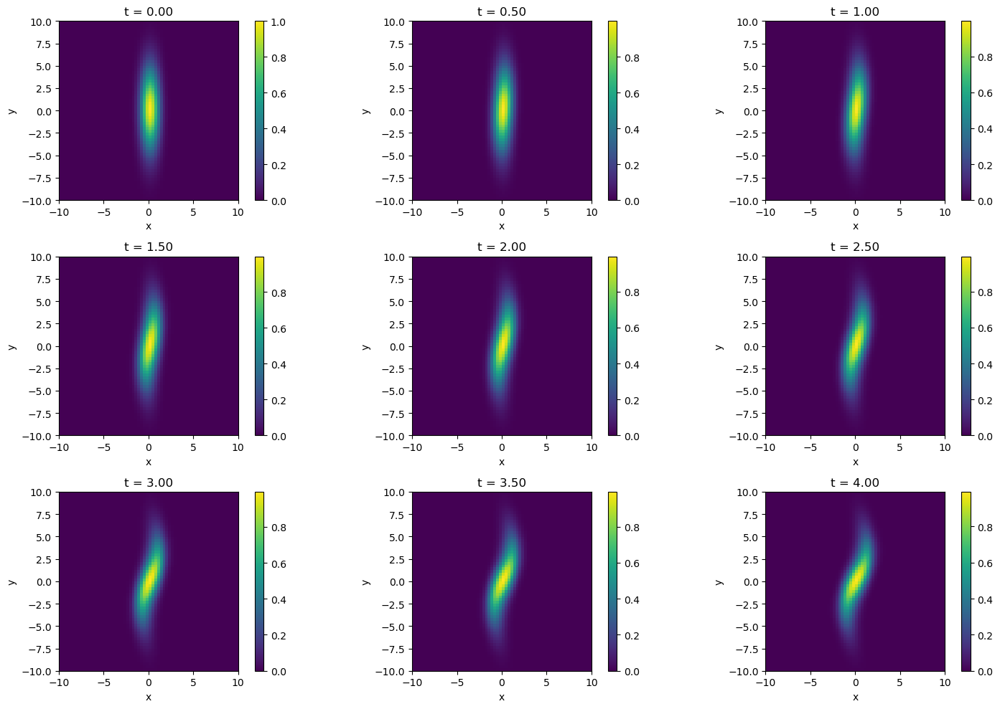

In [22]:
from scipy.integrate import solve_ivp
# Define the ODE system
def fft_rhs(t, w2, nx, ny, N, KX, KY, K, nu):
    wt = w2.reshape((nx, ny)) 
    wt = fft2(wt)
    psit = -wt / K
    psi = np.real(ifft2(psit)).reshape(N)
    rhs = nu*np.dot(A, w2) - np.dot(B, psi)*np.dot(C,w2) + np.dot(C,psi)*np.dot(B,w2)
    return rhs

start_time = time.time() # Record the start time

wsol = solve_ivp(fft_rhs, [0,4], w2, t_eval = tspan, args=(nx, ny, N, KX, KY, K, nu))
A1 = wsol.y

end_time = time.time() # Record the end time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")

wsol_reshape = np.real(wsol.y.reshape(m, m, -1))

# plot
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
for i, ax in enumerate(axes.flat):
    if i < len(tspan):
        im = ax.imshow(wsol_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
        ax.set_title(f"t = {tspan[i]:.2f}")
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        fig.colorbar(im, ax=ax)
plt.tight_layout()
plt.show()

# A/b

Elapsed time: 21.04 seconds


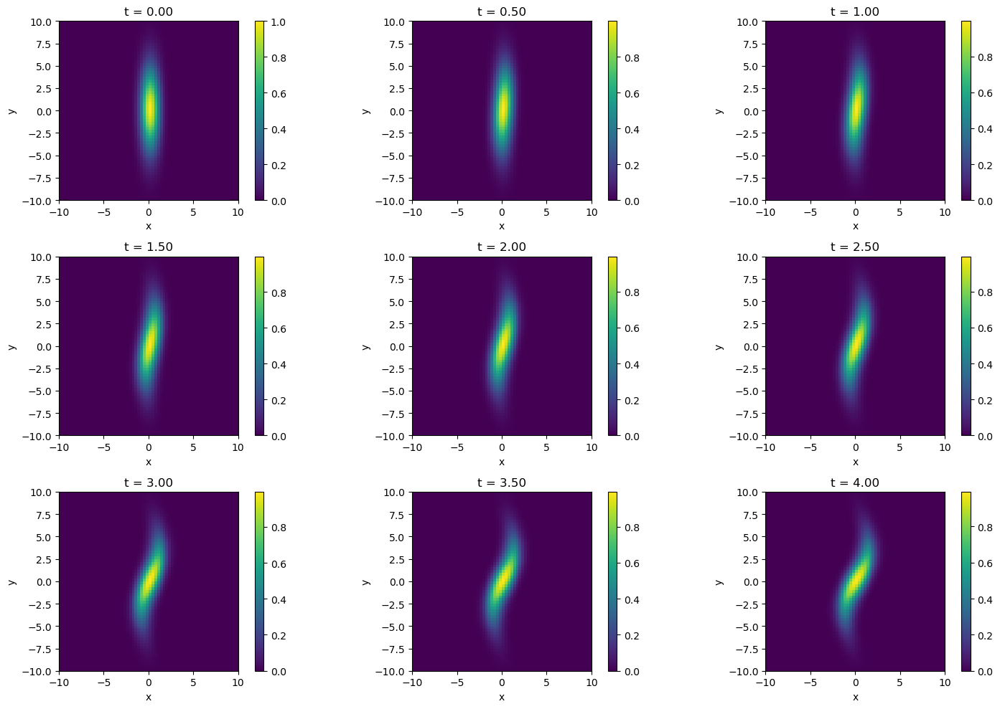

In [20]:
def ab(t, w2, nx, ny, N, KX, KY, K, nu):
    psi = np.linalg.solve(A, w2)
    rhs = nu*np.dot(A, w2) - np.dot(B, psi)*np.dot(C,w2) + np.dot(B,w2)*np.dot(C,psi)
    return rhs

start_time = time.time() # Record the start time

absol = solve_ivp(ab, [0,4], w2, t_eval = tspan, args=(nx, ny, N, KX, KY, K, nu))
A2 = absol.y

end_time = time.time() # Record the end time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")

absol_reshape = np.real(absol.y.reshape(m, m, -1))

# plot
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
for i, ax in enumerate(axes.flat):
    if i < len(tspan):
        im = ax.imshow(absol_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
        ax.set_title(f"t = {tspan[i]:.2f}")
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        fig.colorbar(im, ax=ax)
plt.tight_layout()
plt.show()

# LU

Elapsed time: 1.23 seconds
(64, 64, 9)


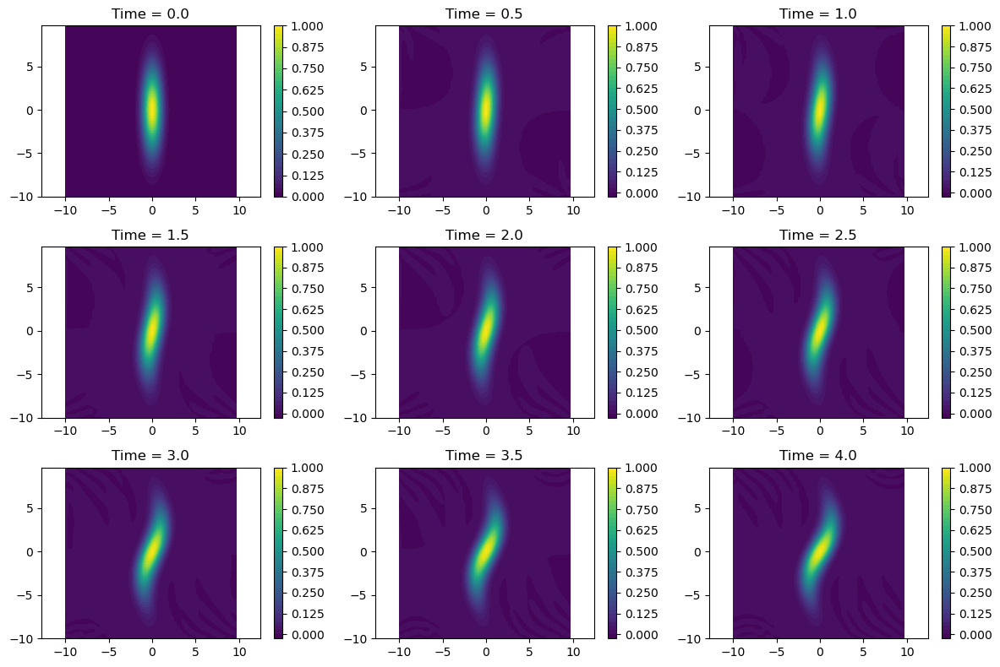

In [4]:
from scipy.linalg import lu, solve_triangular

P, L, U = lu(A)


def lu(t, w2, nx, ny, N, KX, KY, K, nu, P, L, U):
    Pb = np.dot(P, w2)
    y = solve_triangular(L, Pb, lower=True)
    x = solve_triangular(U, y)
    psi = x
    rhs = nu*np.dot(A, w2) - np.dot(B, psi)*np.dot(C,w2) + np.dot(B,w2)*np.dot(C,psi)
    return rhs
    
    
start_time = time.time() # Record the start time

lusol = solve_ivp(lu, [0,4], w2, t_eval = tspan, args=(nx, ny, N, KX, KY, K, nu, P, L, U))
A3 = lusol.y

end_time = time.time() # Record the end time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")

lusol_reshape = np.real(lusol.y.reshape(m, m, -1))
print(np.shape(lusol_reshape))

## plot
#fig, axes = plt.subplots(3, 3, figsize=(15, 10))
#for i, ax in enumerate(axes.flat):
#    if i < len(tspan):
#        im = ax.imshow(lusol_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#        ax.set_title(f"t = {tspan[i]:.2f}")
#        ax.set_xlabel('x')
#        ax.set_ylabel('y')
#        fig.colorbar(im, ax=ax)
#plt.tight_layout()
#plt.show()

plt.figure(figsize=(12, 8))
for i in range(len(tspan)):
    plt.subplot(3, 3, i + 1)
    plt.contourf(x, y, lusol_reshape[:, :, i], levels=40, cmap='viridis')
    plt.title(f'Time = {tspan[i]:.1f}')
    plt.colorbar()
    plt.axis('equal')

plt.tight_layout()
plt.show()

# BICGSTAB

Elapsed time: 73.82 seconds


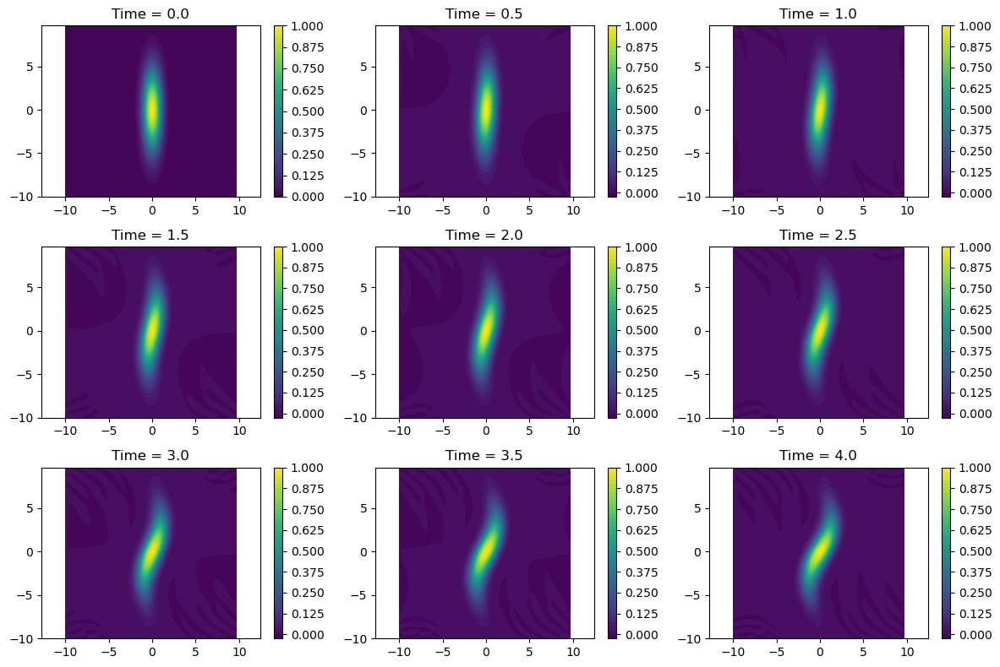

In [8]:
from scipy.sparse.linalg import bicgstab

def bicgstab_rhs(t, w2, nx, ny, N, KX, KY, K, nu):
    psi = bicgstab(A, w2)
    psi = psi[0]
    rhs = nu*np.dot(A, w2) - np.dot(B, psi)*np.dot(C,w2) + np.dot(B,w2)*np.dot(C,psi)
    return rhs

start_time = time.time() # Record the start time

bic = solve_ivp(bicgstab_rhs, [0,4], w2, t_eval = tspan, args=(nx, ny, N, KX, KY, K, nu))
bic_y = bic.y

end_time = time.time() # Record the end time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")

bic_reshape = np.real(bic_y.reshape(m, m, -1))
#im = ax.imshow(bic_reshape, extent=[-L/2, L/2, -L/2, L/2], origin='lower')

# plot
#fig, axes = plt.subplots(3, 3, figsize=(15, 10))
#for i, ax in enumerate(axes.flat):
#    if i < len(tspan):
#        im = ax.imshow(bic_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#        ax.set_title(f"t = {tspan[i]:.2f}")
#        ax.set_xlabel('x')
#        ax.set_ylabel('y')
#        fig.colorbar(im, ax=ax)
#plt.tight_layout()
#plt.show()

plt.figure(figsize=(12, 8))
for i in range(len(tspan)):
    plt.subplot(3, 3, i + 1)
    plt.contourf(x, y, bic_reshape[:, :, i], levels=40, cmap='viridis')
    plt.title(f'Time = {tspan[i]:.1f}')
    plt.colorbar()
    plt.axis('equal')

plt.tight_layout()
plt.show()

# GMRES

Elapsed time: 574.27 seconds


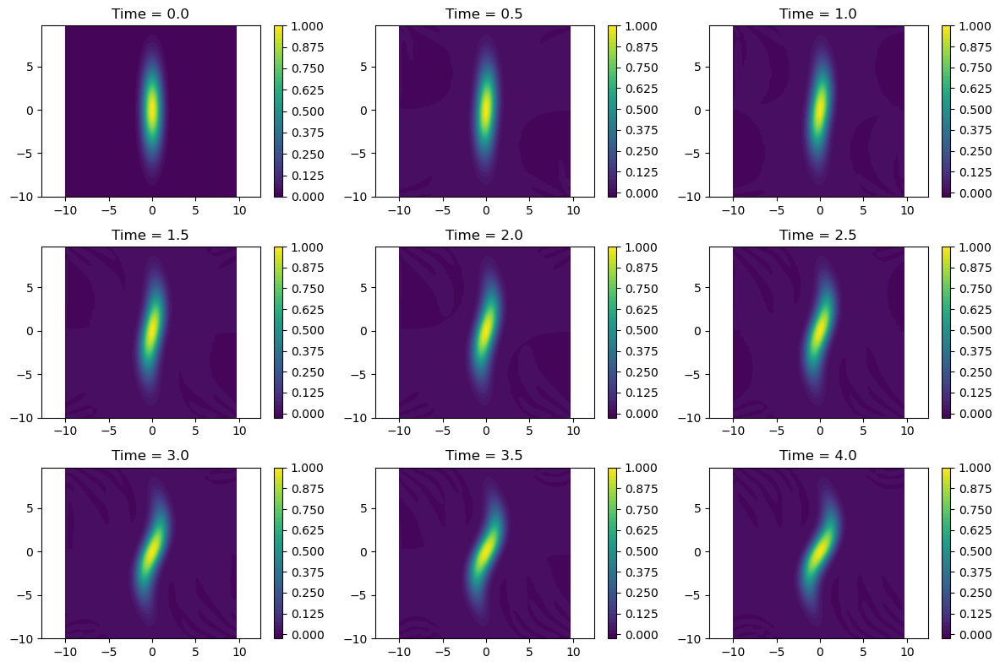

In [22]:
#from scipy.sparse.linalg import gmres
#
#def gmres_rhs(t, w2, nx, ny, N, KX, KY, K, nu):
#    psi, info = gmres(A, w2)
#    psi = psi.reshape(N)
#    rhs = nu*np.dot(A, w2) - np.dot(B, psi)*np.dot(C,w2) + np.dot(B,w2)*np.dot(C,psi)
#    return rhs
#
#start_time = time.time() # Record the start time
#
#gmr = solve_ivp(gmres_rhs, [0,4], w2, t_eval = tspan, args=(nx, ny, N, KX, KY, K, nu))
#gmr_y = gmr.y
#
#end_time = time.time() # Record the end time
#elapsed_time = end_time - start_time
#print(f"Elapsed time: {elapsed_time:.2f} seconds")
#
#gmr_reshape = np.real(gmr_y.reshape(m, m, -1))
#
#plt.figure(figsize=(12, 8))
#for i in range(len(tspan)):
#    plt.subplot(3, 3, i + 1)
#    plt.contourf(x, y, gmr_reshape[:, :, i], levels=40, cmap='viridis')
#    plt.title(f'Time = {tspan[i]:.1f}')
#    plt.colorbar()
#    plt.axis('equal')
#
#plt.tight_layout()
#plt.show()

# Different Initial Conditions

Elapsed time: 108.06 seconds


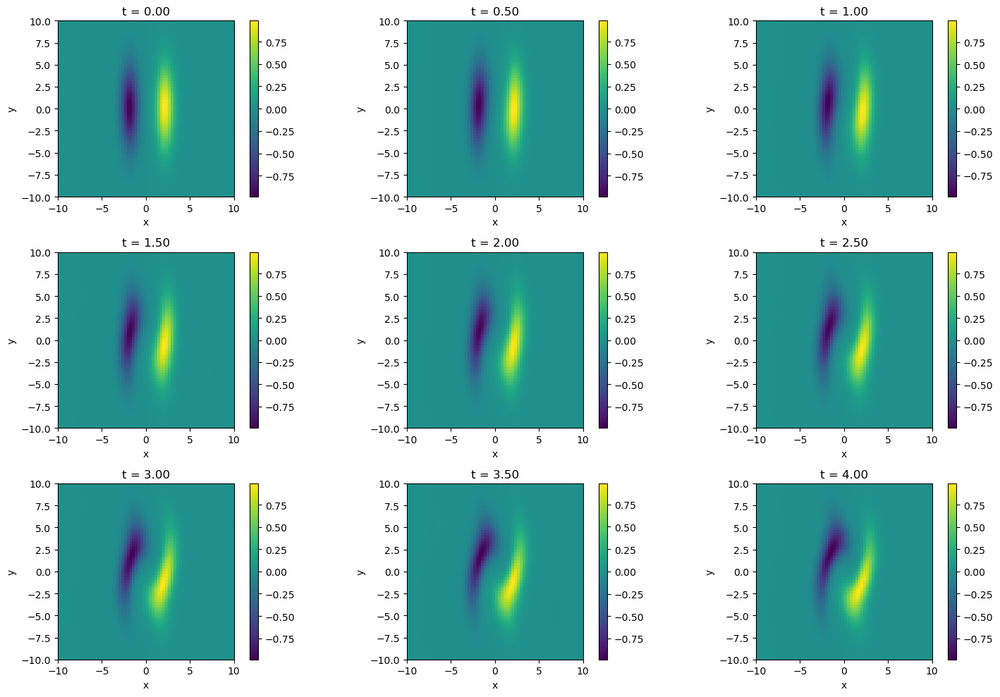

In [7]:
## Two oppositely “charged” Gaussian vorticies next to each other
#
#t1 = np.arange(0, 400.5, 0.5)
#
#w_two_opp_a = 1 * np.exp(-(X-2)**2 - Y**2/20) + 1j * np.zeros((nx, ny)) # Initialize as complex
#w_two_opp_b = -1 * np.exp(-(X+2)**2 - Y**2/20) + 1j * np.zeros((nx, ny)) # Initialize as complex
#w2_two_opp = (w_two_opp_a+w_two_opp_b).reshape(N)
#
#
#start_time = time.time() # Record the start time
#
#two_opp = solve_ivp(fft_rhs, [0,400], w2_two_opp, t_eval = t1, args=(nx, ny, N, KX, KY, K, nu))
#
#
#end_time = time.time() # Record the end time
#elapsed_time = end_time - start_time
#print(f"Elapsed time: {elapsed_time:.2f} seconds")
#
#two_opp_reshape = np.real(two_opp.y.reshape(m, m, -1))
#
## plot
#fig, axes = plt.subplots(3, 3, figsize=(15, 10))
#for i, ax in enumerate(axes.flat):
#    if i < len(tspan):
#        im = ax.imshow(two_opp_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#        ax.set_title(f"t = {tspan[i]:.2f}")
#        ax.set_xlabel('x')
#        ax.set_ylabel('y')
#        fig.colorbar(im, ax=ax)
#plt.tight_layout()
#plt.show()

Elapsed time: 101.06 seconds


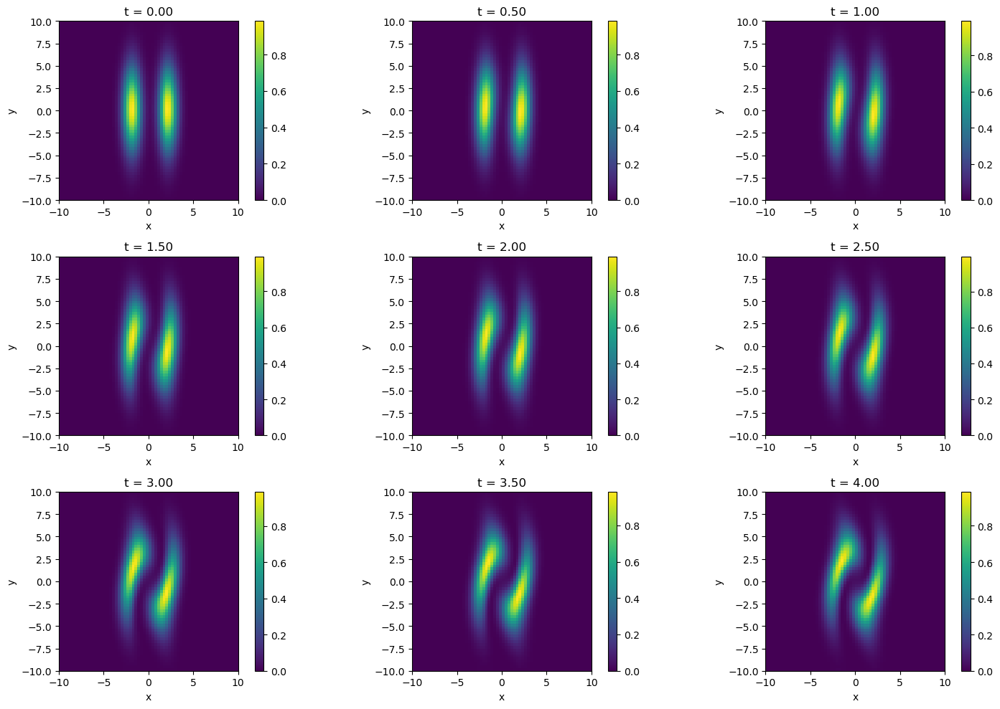

In [11]:
## Two same “charged” Gaussian vorticies next to each other
#
#w_two_same_a = 1 * np.exp(-(X-2)**2 - Y**2/20) + 1j * np.zeros((nx, ny)) # Initialize as complex
#w_two_same_b = 1 * np.exp(-(X+2)**2 - Y**2/20) + 1j * np.zeros((nx, ny)) # Initialize as complex
#w2_two_same = (w_two_same_a+w_two_same_b).reshape(N)
#
#
#start_time = time.time() # Record the start time
#
#two_same = solve_ivp(fft_rhs, [0,400], w2_two_same, t_eval = t1, args=(nx, ny, N, KX, KY, K, nu))
#
#
#end_time = time.time() # Record the end time
#elapsed_time = end_time - start_time
#print(f"Elapsed time: {elapsed_time:.2f} seconds")
#
#two_same_reshape = np.real(two_same.y.reshape(m, m, -1))
#
## plot
#fig, axes = plt.subplots(3, 3, figsize=(15, 10))
#for i, ax in enumerate(axes.flat):
#    if i < len(tspan):
#        im = ax.imshow(two_same_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#        ax.set_title(f"t = {tspan[i]:.2f}")
#        ax.set_xlabel('x')
#        ax.set_ylabel('y')
#        fig.colorbar(im, ax=ax)
#plt.tight_layout()
#plt.show()

Elapsed time: 22.36 seconds


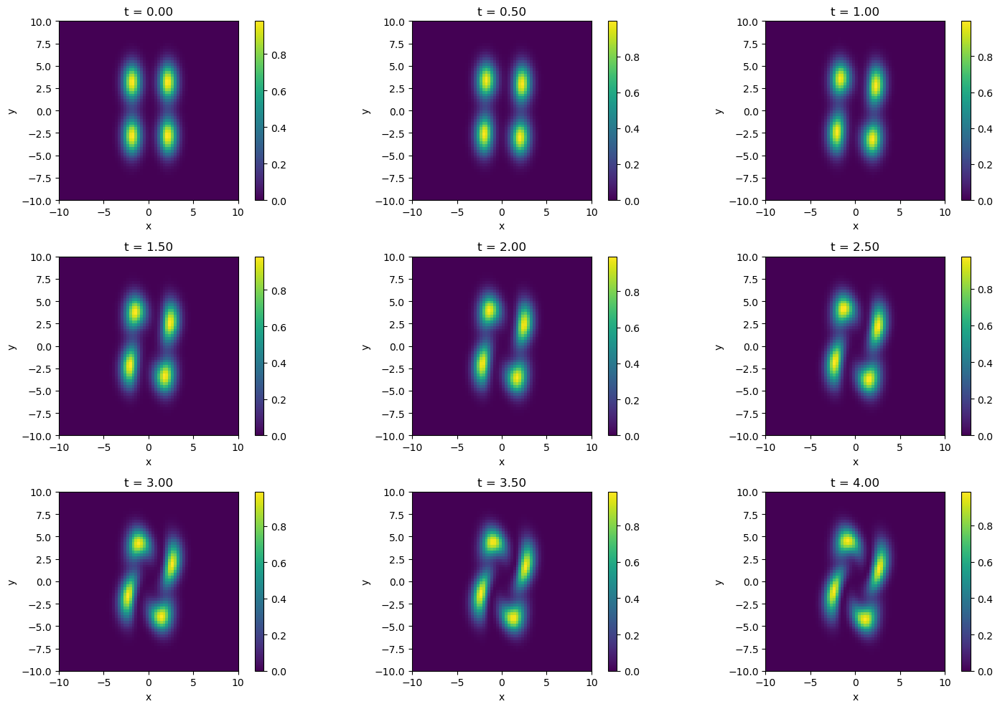

In [13]:
##Two pairs of oppositely “charged” vorticies which can be made to collide with each other
#
#w_two_pair_a1 = 1 * np.exp(-(X-2)**2 - (Y-3)**2/4) # Initialize as complex
#w_two_pair_a2 = 1 * np.exp(-(X+2)**2 - (Y-3)**2/4) # Initialize as complex
#w_two_pair_b1 = 1 * np.exp(-(X-2)**2 - (Y+3)**2/4) # Initialize as complex
#w_two_pair_b2 = 1 * np.exp(-(X+2)**2 - (Y+3)**2/4) # Initialize as complex
#w2_two_pair = (w_two_pair_a1+w_two_pair_a2+ w_two_pair_b1+w_two_pair_b2).reshape(N)
#
#
#start_time = time.time() # Record the start time
#
#two_pair = solve_ivp(fft_rhs, [0,400], w2_two_pair, t_eval = t1, args=(nx, ny, N, KX, KY, K, nu))
#
#
#end_time = time.time() # Record the end time
#elapsed_time = end_time - start_time
#print(f"Elapsed time: {elapsed_time:.2f} seconds")
#
#two_pair_reshape = np.real(two_pair.y.reshape(m, m, -1))
#
#
## plot
#fig, axes = plt.subplots(3, 3, figsize=(15, 10))
#for i, ax in enumerate(axes.flat):
#    if i < len(tspan):
#        im = ax.imshow(two_pair_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#        ax.set_title(f"t = {tspan[i]:.2f}")
#        ax.set_xlabel('x')
#        ax.set_ylabel('y')
#        fig.colorbar(im, ax=ax)
#plt.tight_layout()
#plt.show()
#
##plt.figure(figsize=(12, 8))
##for i in range(len(tspan)):
##    plt.subplot(3, 3, i + 1)
##    plt.contourf(x, y, two_pair_reshape[:, :, i], levels=40, cmap='viridis')
##    plt.title(f'Time = {tspan[i]:.1f}')
##    plt.colorbar()
##    plt.axis('equal')
##
##plt.tight_layout()
##plt.show()

Elapsed time: 26.06 seconds


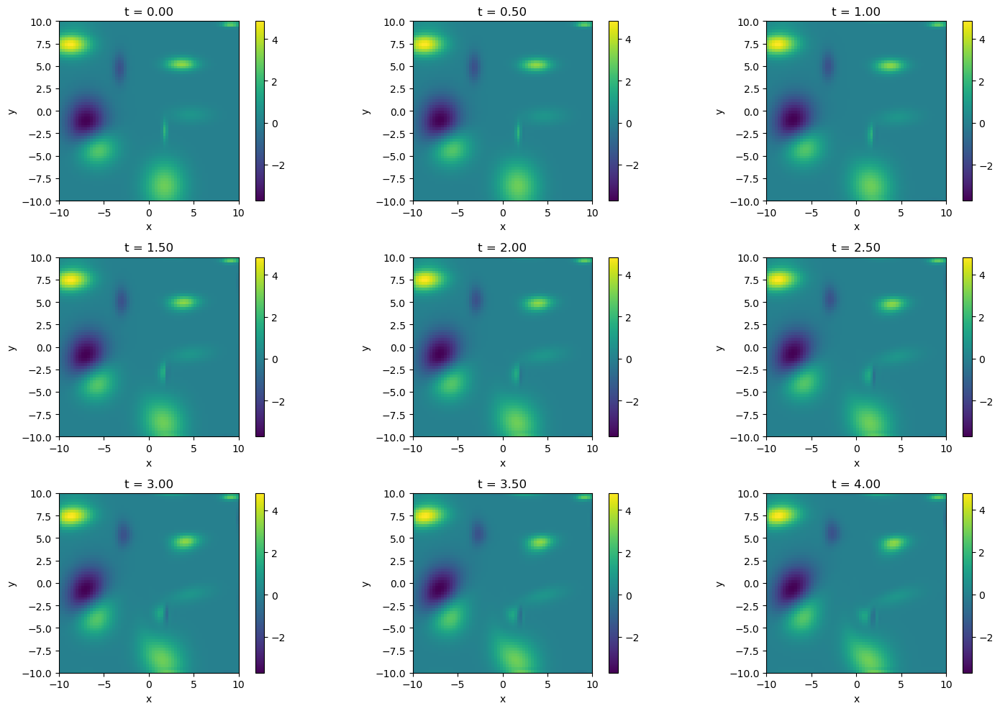

In [18]:
##A random assortment (in position, strength, charge, ellipticity, etc.) of vorticies on the periodic domain.
##Try 10-15 vorticies and watch what happens.
#
#num_vortices = 10
#vortices = np.zeros((nx, ny, num_vortices))
#
#for i in range(num_vortices):
#    x_pos = 20 * np.random.rand(1) - 10
#    y_pos = 20 * np.random.rand(1) - 10
#    strength = 5 * np.random.rand(1) 
#    charge_rand = np.random.rand(1)
#    if charge_rand < 0.5:
#        charge = -1
#    else:
#        charge = 1
#    x_ell = 3 * np.random.rand(1)
#    y_ell = 3 * np.random.rand(1)
#    
#    temp_vort = (charge * strength) * np.exp(-(X - x_pos)**2/x_ell**2 - (Y - y_pos)**2/y_ell**2)
#    vortices[:,:,i] = temp_vort
#    
#w2_random = np.sum(vortices, 2)
#w2_random = w2_random.reshape(N)
#
#
#start_time = time.time() # Record the start time
#
#random = solve_ivp(fft_rhs, [0,400], w2_random, t_eval = t1, args=(nx, ny, N, KX, KY, K, nu))
#
#
#end_time = time.time() # Record the end time
#elapsed_time = end_time - start_time
#print(f"Elapsed time: {elapsed_time:.2f} seconds")
#
#random_reshape = np.real(random.y.reshape(m, m, -1))
#
#
## plot
#fig, axes = plt.subplots(3, 3, figsize=(15, 10))
#for i, ax in enumerate(axes.flat):
#    if i < len(tspan):
#        im = ax.imshow(random_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#        ax.set_title(f"t = {tspan[i]:.2f}")
#        ax.set_xlabel('x')
#        ax.set_ylabel('y')
#        fig.colorbar(im, ax=ax)
#plt.tight_layout()
#plt.show()

# Movies

MovieWriter ffmpeg unavailable; using Pillow instead.


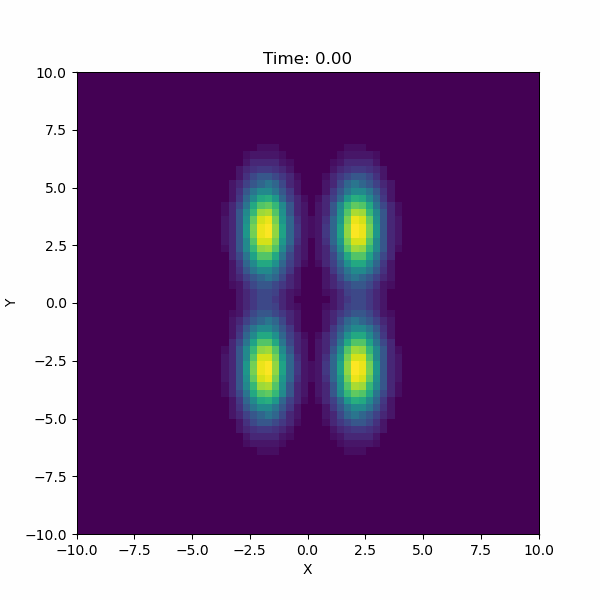

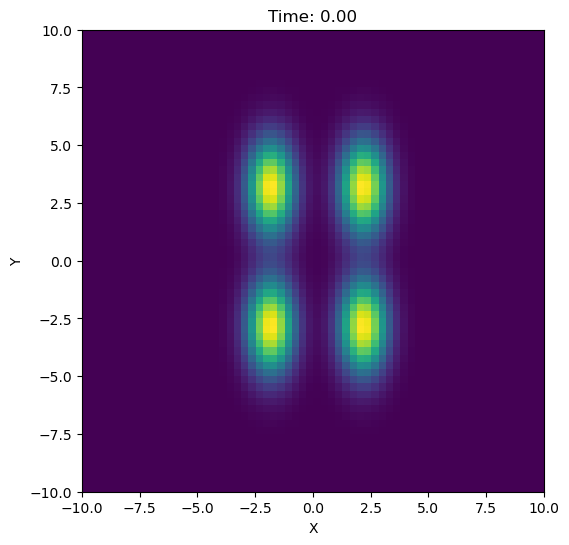

In [21]:
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib.animation as animation
#from IPython.display import Image
#
#fig, ax = plt.subplots(figsize=(6, 6))
#
#
## Function to update the plot for each frame in the animation
#def update_frame(i):
#    ax.clear()  # Clear the previous frame
#    #two oppositely charged
#    #im = ax.imshow(two_opp_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#    
#    #two same charged
#    #im = ax.imshow(two_same_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#    
#    #two pairs
#    im = ax.imshow(two_pair_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#    
#    #random vorticies
#    #im = ax.imshow(random_reshape[:, :, i], extent=[-L/2, L/2, -L/2, L/2], origin='lower')
#    
#    ax.set_title(f"Time: {t1[i]:.2f}")  # Display the current time step
#    ax.set_xlabel("X")
#    ax.set_ylabel("Y")
#    ax.set_aspect('equal')  # Ensure the plot is square
#
## Create the animation object
#ani = animation.FuncAnimation(fig, update_frame, frames=range(401), interval=100)
#
## Save and load the animation
#ani.save('pairs.gif', writer='ffmpeg', fps=20)
#Image(open('pairs.gif', 'rb').read())